<a href="https://colab.research.google.com/github/khushimitr/YogaPoseEstimationAndClassification/blob/main/YogaPoseEstimationAndClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## this module is taken from tensorflow example repository to use functions and algorithms in the project

In [ ]:
import enum
from typing import List, NamedTuple

import numpy as np

In [ ]:
class BodyPart(enum.Enum):
  """Enum representing human body keypoints detected by pose estimation models."""
  NOSE = 0
  LEFT_EYE = 1
  RIGHT_EYE = 2
  LEFT_EAR = 3
  RIGHT_EAR = 4
  LEFT_SHOULDER = 5
  RIGHT_SHOULDER = 6
  LEFT_ELBOW = 7
  RIGHT_ELBOW = 8
  LEFT_WRIST = 9
  RIGHT_WRIST = 10
  LEFT_HIP = 11
  RIGHT_HIP = 12
  LEFT_KNEE = 13
  RIGHT_KNEE = 14
  LEFT_ANKLE = 15
  RIGHT_ANKLE = 16

In [ ]:
class Point(NamedTuple):
  """A point in 2D space."""
  x: float
  y: float

In [ ]:
class Rectangle(NamedTuple):
  """A rectangle in 2D space."""
  start_point: Point
  end_point: Point

In [ ]:
class KeyPoint(NamedTuple):
  """A detected human keypoint."""
  body_part: BodyPart
  coordinate: Point
  score: float

In [ ]:
class Person(NamedTuple):
  """A pose detected by a pose estimation model."""
  keypoints: List[KeyPoint]
  bounding_box: Rectangle
  score: float
  id: int = None

In [ ]:
def person_from_keypoints_with_scores(
    keypoints_with_scores: np.ndarray,
    image_height: float,
    image_width: float,
    keypoint_score_threshold: float = 0.1) -> Person:
  """Creates a Person instance from single pose estimation model output.
  Args:
    keypoints_with_scores: Output of the TFLite pose estimation model. A numpy
      array with shape [17, 3]. Each row represents a keypoint: [y, x, score].
    image_height: height of the image in pixels.
    image_width: width of the image in pixels.
    keypoint_score_threshold: Only use keypoints with above this threshold to
      calculate the person average score.
  Returns:
    A Person instance.
  """

  kpts_x = keypoints_with_scores[:, 1]
  kpts_y = keypoints_with_scores[:, 0]
  scores = keypoints_with_scores[:, 2]

  # Convert keypoints to the input image coordinate system.
  keypoints = []
  for i in range(scores.shape[0]):
    keypoints.append(
        KeyPoint(
            BodyPart(i),
            Point(int(kpts_x[i] * image_width), int(kpts_y[i] * image_height)),
            scores[i])
        )

  # Calculate bounding box as SinglePose models don't return bounding box.
  start_point = Point(
      int(np.amin(kpts_x) * image_width), int(np.amin(kpts_y) * image_height))
  end_point = Point(
      int(np.amax(kpts_x) * image_width), int(np.amax(kpts_y) * image_height))
  bounding_box = Rectangle(start_point, end_point)

  # Calculate person score by averaging keypoint scores.
  scores_above_threshold = list(
      filter(lambda x: x > keypoint_score_threshold, scores))
  person_score = np.average(scores_above_threshold)

  return Person(keypoints, bounding_box, person_score)

In [ ]:
class Category(NamedTuple):
  """A classification category."""
  label: str
  score: float

## Code to run a pose estimation with a TFLite MoveNet model.

In [ ]:
import os
from typing import Dict, List

import cv2
import numpy as np
import tensorflow as tf

In [ ]:
try:
  # Import TFLite interpreter from tflite_runtime package if it's available.
  from tflite_runtime.interpreter import Interpreter
except ImportError:
  # If not, fallback to use the TFLite interpreter from the full TF package.
  import tensorflow as tf
  Interpreter = tf.lite.Interpreter

In [ ]:
class Movenet(object):
  """A wrapper class for a Movenet TFLite pose estimation model."""

  # Configure how confidence the model should be on the detected keypoints to
  # proceed with using smart cropping logic.
  _MIN_CROP_KEYPOINT_SCORE = 0.2
  _TORSO_EXPANSION_RATIO = 1.9
  _BODY_EXPANSION_RATIO = 1.2

  def __init__(self, model_name: str) -> None:
    """Initialize a MoveNet pose estimation model.
    Args:
      model_name: Name of the TFLite MoveNet model.
    """

    # Append TFLITE extension to model_name if there's no extension
    _, ext = os.path.splitext(model_name)
    if not ext:
      model_name += '.tflite'

    # Initialize model
    interpreter = Interpreter(model_path=model_name, num_threads=4)
    interpreter.allocate_tensors()

    self._input_index = interpreter.get_input_details()[0]['index']
    self._output_index = interpreter.get_output_details()[0]['index']

    self._input_height = interpreter.get_input_details()[0]['shape'][1]
    self._input_width = interpreter.get_input_details()[0]['shape'][2]

    self._interpreter = interpreter
    self._crop_region = None

  def init_crop_region(self, image_height: int,
                       image_width: int) -> Dict[(str, float)]:
    if image_width > image_height:
      x_min = 0.0
      box_width = 1.0
      # Pad the vertical dimension to become a square image.
      y_min = (image_height / 2 - image_width / 2) / image_height
      box_height = image_width / image_height
    else:
      y_min = 0.0
      box_height = 1.0
      # Pad the horizontal dimension to become a square image.
      x_min = (image_width / 2 - image_height / 2) / image_width
      box_width = image_height / image_width

    return {
        'y_min': y_min,
        'x_min': x_min,
        'y_max': y_min + box_height,
        'x_max': x_min + box_width,
        'height': box_height,
        'width': box_width
    }

  def _torso_visible(self, keypoints: np.ndarray) -> bool:
    left_hip_score = keypoints[BodyPart.LEFT_HIP.value, 2]
    right_hip_score = keypoints[BodyPart.RIGHT_HIP.value, 2]
    left_shoulder_score = keypoints[BodyPart.LEFT_SHOULDER.value, 2]
    right_shoulder_score = keypoints[BodyPart.RIGHT_SHOULDER.value, 2]

    left_hip_visible = left_hip_score > Movenet._MIN_CROP_KEYPOINT_SCORE
    right_hip_visible = right_hip_score > Movenet._MIN_CROP_KEYPOINT_SCORE
    left_shoulder_visible = left_shoulder_score > Movenet._MIN_CROP_KEYPOINT_SCORE
    right_shoulder_visible = right_shoulder_score > Movenet._MIN_CROP_KEYPOINT_SCORE

    return ((left_hip_visible or right_hip_visible) and
            (left_shoulder_visible or right_shoulder_visible))

  def _determine_torso_and_body_range(self, keypoints: np.ndarray,
                                      target_keypoints: Dict[(str, float)],
                                      center_y: float,
                                      center_x: float) -> List[float]:
    torso_joints = [
        BodyPart.LEFT_SHOULDER, BodyPart.RIGHT_SHOULDER, BodyPart.LEFT_HIP,
        BodyPart.RIGHT_HIP
    ]
    
    max_torso_yrange = 0.0
    max_torso_xrange = 0.0
    for joint in torso_joints:
      dist_y = abs(center_y - target_keypoints[joint][0])
      dist_x = abs(center_x - target_keypoints[joint][1])
      if dist_y > max_torso_yrange:
        max_torso_yrange = dist_y
      if dist_x > max_torso_xrange:
        max_torso_xrange = dist_x

    max_body_yrange = 0.0
    max_body_xrange = 0.0
    for idx in range(len(BodyPart)):
      if keypoints[BodyPart(idx).value, 2] < Movenet._MIN_CROP_KEYPOINT_SCORE:
        continue
      dist_y = abs(center_y - target_keypoints[joint][0])
      dist_x = abs(center_x - target_keypoints[joint][1])
      if dist_y > max_body_yrange:
        max_body_yrange = dist_y
      if dist_x > max_body_xrange:
        max_body_xrange = dist_x

    return [
        max_torso_yrange, max_torso_xrange, max_body_yrange, max_body_xrange
    ]

  def _determine_crop_region(self, keypoints: np.ndarray, image_height: int,
                             image_width: int) -> Dict[(str, float)]:
    # Convert keypoint index to human-readable names.
    target_keypoints = {}
    for idx in range(len(BodyPart)):
      target_keypoints[BodyPart(idx)] = [
          keypoints[idx, 0] * image_height, keypoints[idx, 1] * image_width
      ]

    # Calculate crop region if the torso is visible.
    if self._torso_visible(keypoints):
      center_y = (target_keypoints[BodyPart.LEFT_HIP][0] +
                  target_keypoints[BodyPart.RIGHT_HIP][0]) / 2
      center_x = (target_keypoints[BodyPart.LEFT_HIP][1] +
                  target_keypoints[BodyPart.RIGHT_HIP][1]) / 2

      (max_torso_yrange, max_torso_xrange, max_body_yrange,
       max_body_xrange) = self._determine_torso_and_body_range(
           keypoints, target_keypoints, center_y, center_x)

      crop_length_half = np.amax([
          max_torso_xrange * Movenet._TORSO_EXPANSION_RATIO,
          max_torso_yrange * Movenet._TORSO_EXPANSION_RATIO,
          max_body_yrange * Movenet._BODY_EXPANSION_RATIO,
          max_body_xrange * Movenet._BODY_EXPANSION_RATIO
      ])

      # Adjust crop length so that it is still within the image border
      distances_to_border = np.array(
          [center_x, image_width - center_x, center_y, image_height - center_y])
      crop_length_half = np.amin(
          [crop_length_half, np.amax(distances_to_border)])

      # If the body is large enough, there's no need to apply cropping logic.
      if crop_length_half > max(image_width, image_height) / 2:
        return self.init_crop_region(image_height, image_width)
      # Calculate the crop region that nicely covers the full body.
      else:
        crop_length = crop_length_half * 2
      crop_corner = [center_y - crop_length_half, center_x - crop_length_half]
      return {
          'y_min':
              crop_corner[0] / image_height,
          'x_min':
              crop_corner[1] / image_width,
          'y_max': (crop_corner[0] + crop_length) / image_height,
          'x_max': (crop_corner[1] + crop_length) / image_width,
          'height': (crop_corner[0] + crop_length) / image_height -
                    crop_corner[0] / image_height,
          'width': (crop_corner[1] + crop_length) / image_width -
                   crop_corner[1] / image_width
      }
    # Return the initial crop regsion if the torso isn't visible.
    else:
      return self.init_crop_region(image_height, image_width)

  def _crop_and_resize(self, image: np.ndarray, crop_region: Dict[(str, float)], crop_size: (int, int)) -> np.ndarray:
    """Crops and resize the image to prepare for the model input."""
    y_min, x_min, y_max, x_max = [
        crop_region['y_min'], crop_region['x_min'], crop_region['y_max'],
        crop_region['x_max']
    ]

    crop_top = int(0 if y_min < 0 else y_min * image.shape[0])
    crop_bottom = int(image.shape[0] if y_max >= 1 else y_max * image.shape[0])
    crop_left = int(0 if x_min < 0 else x_min * image.shape[1])
    crop_right = int(image.shape[1] if x_max >= 1 else x_max * image.shape[1])

    padding_top = int(0 - y_min * image.shape[0] if y_min < 0 else 0)
    padding_bottom = int((y_max - 1) * image.shape[0] if y_max >= 1 else 0)
    padding_left = int(0 - x_min * image.shape[1] if x_min < 0 else 0)
    padding_right = int((x_max - 1) * image.shape[1] if x_max >= 1 else 0)



    # Crop and resize image
    output_image = image[crop_top:crop_bottom, crop_left:crop_right]
    
    #cv2.copyMakeBorder() method is used to create a border around the image like a photo frame.
    output_image = cv2.copyMakeBorder(output_image, padding_top, padding_bottom,
                                      padding_left, padding_right,
                                      cv2.BORDER_CONSTANT)
    
    output_image = cv2.resize(output_image, (crop_size[0], crop_size[1]))

    return output_image

  def _run_detector(self, image: np.ndarray, crop_region: Dict[(str, float)],crop_size: (int, int)) -> np.ndarray:

    input_image = self._crop_and_resize(image, crop_region, crop_size=crop_size)

    # print(input_image.shape)

    input_image = input_image.astype(dtype=np.uint8)

    self._interpreter.set_tensor(self._input_index,np.expand_dims(input_image, axis=0))
    self._interpreter.invoke()

    keypoints_with_scores = self._interpreter.get_tensor(self._output_index)
    keypoints_with_scores = np.squeeze(keypoints_with_scores)

    # Update the coordinates.
    for idx in range(len(BodyPart)):
      keypoints_with_scores[idx, 0] = crop_region['y_min'] + crop_region['height'] * keypoints_with_scores[idx, 0]
      keypoints_with_scores[idx, 1] = crop_region['x_min'] + crop_region['width'] * keypoints_with_scores[idx, 1]

    return keypoints_with_scores

  def detect(self,input_image: np.ndarray,reset_crop_region: bool = False) -> Person:
    image_height, image_width, _ = input_image.shape

    # print(image_height,image_width)

    if (self._crop_region is None) or reset_crop_region:
      # Set crop region for the first frame.
      self._crop_region = self.init_crop_region(image_height, image_width)
      # print(self._crop_region)

    # Detect pose using the crop region inferred from the detection result in
    # the previous frame
    keypoint_with_scores = self._run_detector(input_image,self._crop_region, crop_size=(self._input_height, self._input_width))
    
    # Calculate the crop region for the next frame
    self._crop_region = self._determine_crop_region(keypoint_with_scores,
                                                    image_height, image_width)

    # Convert the keypoints with scores to a Person data type

    return person_from_keypoints_with_scores(keypoint_with_scores, image_height,
                                             image_width)

## PreProcessing

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd 
import os
import csv
import tqdm 

In [ ]:
movenet = Movenet('/content/drive/MyDrive/movenet_thunder.tflite')

def detect(input_tensor, inference_count=3):
    movenet.detect(input_tensor.numpy(), reset_crop_region=True)
    
    for _ in range(inference_count - 1):
        detection = movenet.detect(input_tensor.numpy(), 
                                reset_crop_region=False)
    
    return detection

## Results of movenet thunder on a random image

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
EDGES = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

## Drawing the keypoints
def draw_keypoints(frame,keypoints,confidence_thresh):
    for kp in keypoints:
      kx,ky,kp_conf = kp
      if kp_conf > confidence_thresh:
        cv2.circle(frame,(int(kx),int(ky)), 5, (0,0,255), -1)

def draw_connections(frame,keypoints,edges, confidence_thresh):
    shaped = np.squeeze(keypoints)
    for edge,color in edges.items():
      p1,p2 = edge
      x1,y1,c1 = shaped[p1]
      x2,y2,c2 = shaped[p2]
      if(c1 > confidence_thresh) & (c2 > confidence_thresh):
        cv2.line(frame,(int(x1),int(y1)),(int(x2),int(y2)),(0,255,255),2)

def image_resize(image,width = None,height = None,inter = cv2.INTER_AREA):
    (h,w,_) = image.shape
    if width is None and height is None:
        return image
    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))
    resized = cv2.resize(image, dim, interpolation = inter)
    return resized

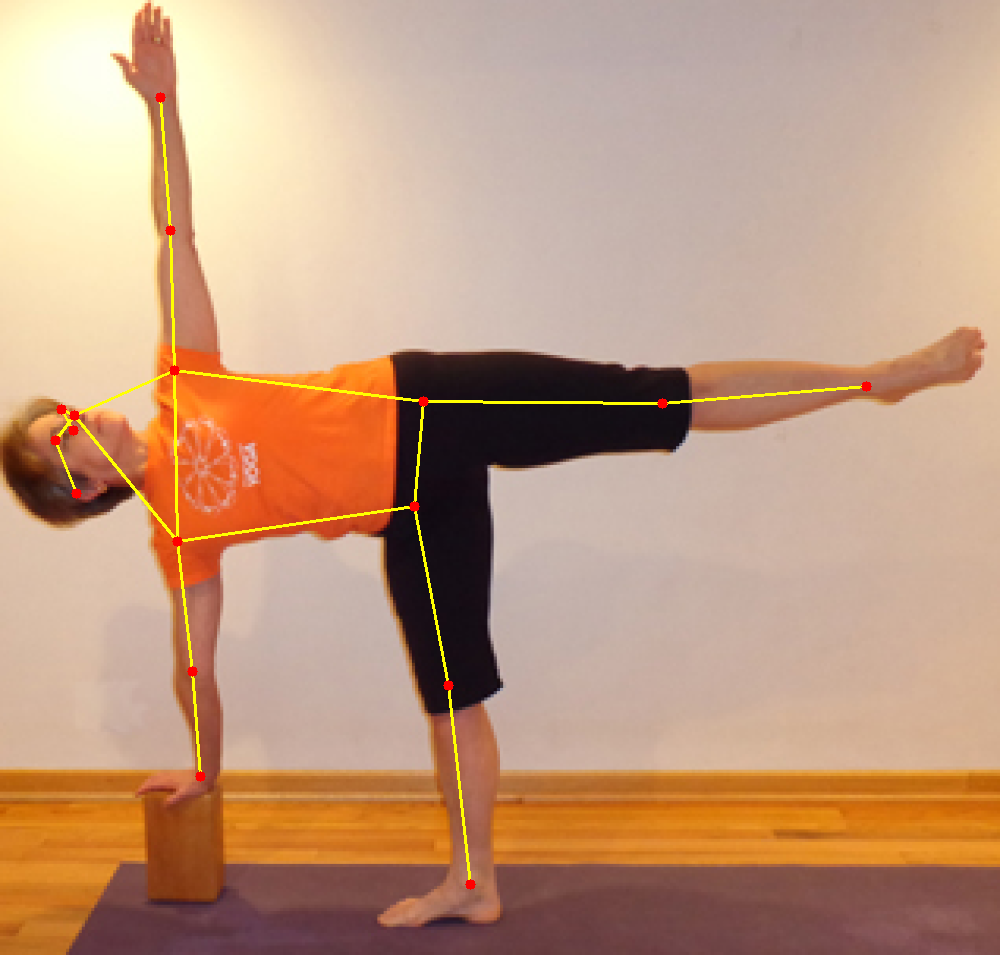

In [ ]:
img_path = "/content/drive/MyDrive/yoga_dataset/train/Ardha_Chandrasana/0-0.png"
img = cv2.imread(img_path)
img = image_resize(img,width = 1000)

rgb_tensor = tf.convert_to_tensor(img, dtype=tf.uint8)
# print(rgb_tensor)

person = detect(rgb_tensor)
pose_landmarks = np.array([[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score] for keypoint in person.keypoints], dtype=np.float32)
test_coord = pose_landmarks.flatten().tolist()

keypoints = []
for kp in person.keypoints:
  keypoints.append([kp.coordinate.x,kp.coordinate.y,kp.score])

draw_connections(img,keypoints,EDGES,0.1)
draw_keypoints(img,keypoints,0.1)

cv2_imshow(img)

## Preprocessing -> Creating Test.csv and Train.csv

In [ ]:
class Preprocessor(object):
    #this class preprocess pose samples, it predicts keypoints on the images 
    #and save those keypoints in a csv file for the later use in the classification task 

    def __init__(self, images_in_folder,
                csvs_out_path):
        self._images_in_folder = images_in_folder
        self._csvs_out_path = csvs_out_path
        self._csvs_out_folder_per_class = 'csv_per_pose'
        self._message = []

        if(self._csvs_out_folder_per_class not in os.listdir()):
            os.makedirs(self._csvs_out_folder_per_class)

        #get list of pose classes
        self._pose_class_names = sorted(
            [n for n in os.listdir(images_in_folder)]
        )


    def process(self, detection_threshold=0.1):
        #Preprocess the images in the given folder
        
        for pose_class_name in self._pose_class_names:
            #paths for pose class
            images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
            csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                           pose_class_name + '.csv')
            
            #Detect landmarks in each images and write it to the csv files
            with open(csv_out_path, 'w') as csv_out_file:
                csv_out_writer = csv.writer(csv_out_file,
                                            delimiter=',',
                                            quoting=csv.QUOTE_MINIMAL)
                #get the list of images
                image_names = sorted(
                    [n for n in os.listdir(images_in_folder)]
                )
                
                valid_image_count = 0
                
                # Detect pose landmarks in each image
                for image_name in tqdm.tqdm(image_names):
                    image_path = os.path.join(images_in_folder, image_name)

                    try:
                        image = tf.io.read_file(image_path)
                        image = tf.io.decode_jpeg(image)
                    except:
                        self._message.append('Skipped' + image_path + ' Invalid image')
                        continue

                    # skip images that is not RGB
                    if image.shape[2] != 3:
                        self._message.append('Skipped' + image_path + ' Image is not in RGB')
                        continue

                    person = detect(image)

                    # Save landmarks if all landmarks above than the threshold
                    min_landmark_score = min([keypoint.score for keypoint in person.keypoints])
                    should_keep_image = min_landmark_score >= detection_threshold
                    
                    if not should_keep_image:
                        self._message.append('Skipped' + image_path + 'Keypoints score are below than threshold')
                        continue

                    valid_image_count += 1

                    # Get landmarks and scale it to the same size as the input image
                    pose_landmarks = np.array(
                          [[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score]
                            for keypoint in person.keypoints],
                              dtype=np.float32)

                    # writing the landmark coordinates to its csv files
                    coord = pose_landmarks.flatten().astype(str).tolist()
                    csv_out_writer.writerow([image_name] + coord)

        print(self._message)

        # combine all per-csv class CSVs into a sigle csv file
        all_landmarks_df = self.all_landmarks_as_dataframe()
        all_landmarks_df.to_csv(self._csvs_out_path, index=False)

    def class_names(self):
        return self.pose_class_names

    def all_landmarks_as_dataframe(self):
        # Merging all csv for each class into a single csv file
        total_df = None
        for class_index, class_name in enumerate(self._pose_class_names):
            csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                           class_name + '.csv')
            per_class_df = pd.read_csv(csv_out_path, header=None)

            # Add the labels
            per_class_df['class_no'] = [class_index]*len(per_class_df)
            per_class_df['class_name'] = [class_name]*len(per_class_df)

            # Append the folder name to the filename first column
            per_class_df[per_class_df.columns[0]] = class_name + '/' +  per_class_df[per_class_df.columns[0]]

            if total_df is None:
                total_df = per_class_df
            else:
                total_df = pd.concat([total_df, per_class_df], axis=0)

        list_name = [[bodypart.name + '_x', bodypart.name + '_y', 
              bodypart.name + '_score'] for bodypart in BodyPart]

        header_name = []
        for columns_name in list_name:
            header_name += columns_name
        header_name = ['filename'] + header_name
        header_map = { total_df.columns[i]: header_name[i]
                         for i in range(len(header_name))
                     }

        total_df.rename(header_map, axis=1, inplace=True)

        return total_df

In [ ]:
# preprocess training data
images_in_folder = os.path.join('/content/drive/MyDrive/yoga_dataset', 'train')
csvs_out_path = '/content/drive/MyDrive/yoga_dataset/train.csv'
train_preprocessor = Preprocessor(
    images_in_folder,
    csvs_out_path
)
train_preprocessor.process()   

In [ ]:
# preprocessing testing data
images_in_folder = os.path.join('yoga_poses', 'test')
csvs_out_path = 'test_data.csv'
test_preprocessor = Preprocessor(
    images_in_folder,
    csvs_out_path
)
test_preprocessor.process()

## Checking images

In [ ]:
import pandas as pd
train_df = pd.read_csv('/content/drive/MyDrive/yoga_dataset/train_data.csv')
train_df.head()

,filename,NOSE_x,NOSE_y,NOSE_score,LEFT_EYE_x,LEFT_EYE_y,LEFT_EYE_score,RIGHT_EYE_x,RIGHT_EYE_y,RIGHT_EYE_score,...,RIGHT_KNEE_y,RIGHT_KNEE_score,LEFT_ANKLE_x,LEFT_ANKLE_y,LEFT_ANKLE_score,RIGHT_ANKLE_x,RIGHT_ANKLE_y,RIGHT_ANKLE_score,class_no,class_name
0,Adho mukha svanasana/00000000.jpg,164.0,135.0,0.707449,159.0,137.0,0.769926,158.0,136.0,0.823337,...,103.0,0.795551,283.0,157.0,0.711082,271.0,151.0,0.833209,0,Adho mukha svanasana
1,Adho mukha svanasana/00000001.jpg,181.0,139.0,0.666340,187.0,140.0,0.549476,188.0,140.0,0.557384,...,107.0,0.949235,58.0,149.0,0.777317,56.0,151.0,0.769886,0,Adho mukha svanasana
2,Adho mukha svanasana/00000002.jpg,194.0,168.0,0.683592,202.0,169.0,0.745491,202.0,169.0,0.751823,...,127.0,0.599693,32.0,191.0,0.780828,30.0,194.0,0.856050,0,Adho mukha svanasana
3,Adho mukha svanasana/00000003.jpg,174.0,158.0,0.777606,181.0,162.0,0.711805,182.0,162.0,0.746871,...,118.0,0.778316,61.0,172.0,0.896245,59.0,174.0,0.852764,0,Adho mukha svanasana
4,Adho mukha svanasana/00000004.jpg,117.0,124.0,0.785857,110.0,126.0,0.692859,110.0,125.0,0.784384,...,89.0,0.811439,266.0,150.0,0.787542,260.0,144.0,0.725234,0,Adho mukha svanasana


In [ ]:
lst = []
cnt = 0
prev = ""
for ind,row in train_df.iterrows():
  fname = row['filename'].split('/')[0]
  if(fname == prev):
    cnt+=1
  else:
    if(ind == 0):
      prev = fname
      continue
    lst.append([prev,cnt])
    prev = fname
    cnt = 0

lst.append([prev,cnt])
prev = ""
cnt = 0

print(lst)

[['Adho mukha svanasana', 433], ['Ananda Balasana', 241], ['Anantasana', 371], ['Anjaneyasana', 448], ['Ardha_Chandrasana', 436], ['Astavakrasana', 208], ['Baddha Konasana', 377], ['Bakasana', 529], ['Balasana', 382], ['Bhujangasana', 448], ['Chakrasana', 385], ['Dandasana', 391], ['Dhanurasana', 334], ['Garudasana', 463], ['Halasana', 493], ['Janusirsasana', 260], ['Malasana', 393], ['Marjariasana', 625], ['Matsyasana', 420], ['Mayurasana', 477], ['Natarajasana', 552], ['Navasana', 545], ['Parsvottanasana', 276], ['Paschimottanasana', 421], ['Prasarita Padottanasana', 393], ['Purvottanasana', 436], ['Rajakapotasana', 372], ['Salabhasana', 391], ['Shavasana', 387], ['Sirsasana', 492], ['Supta_Padangusthasana', 257], ['Tittibhasana', 265], ['Tulasana', 299], ['Urdhva Prasarita Eka Padasana', 233], ['Ustrasana', 518], ['Utkatasana', 494], ['Uttana Shishosana', 326], ['Uttanasana', 565], ['Utthita Hasta Padangusthasana', 358], ['Utthita Parsvakonasana', 468], ['Utthita Trikonasana', 505],

In [ ]:
df = pd.DataFrame(lst)
df.columns = ['Pose','Trainable Images']
df = df.sort_values('Trainable Images')
df.head(50)

,Pose,Trainable Images
47,hastaauttasana,158
5,Astavakrasana,208
33,Urdhva Prasarita Eka Padasana,233
1,Ananda Balasana,241
30,Supta_Padangusthasana,257
15,Janusirsasana,260
31,Tittibhasana,265
22,Parsvottanasana,276
46,ashtang_namaskara,279
32,Tulasana,299


## Making data ready for model

In [ ]:
import csv
import pandas as pd
from tensorflow import keras
from sklearn.model_selection import train_test_split
import tensorflow as tf

In [ ]:
# loading final csv file
def load_csv(csv_path):
    df = pd.read_csv(csv_path)
    df.drop(['filename'],axis=1, inplace=True)
    classes = df.pop('class_name').unique()
    y = df.pop('class_no')
    
    X = df.astype('float64')
    y = keras.utils.to_categorical(y)
    
    return X, y, classes

In [ ]:
def get_center_point(landmarks, left_bodypart, right_bodypart):
    """Calculates the center point of the two given landmarks."""
    left = tf.gather(landmarks, left_bodypart.value, axis=1)
    right = tf.gather(landmarks, right_bodypart.value, axis=1)
    center = left * 0.5 + right * 0.5
    return center

In [ ]:
def get_pose_size(landmarks, torso_size_multiplier=2.5):
    """Calculates pose size.
    It is the maximum of two values:
    * Torso size multiplied by `torso_size_multiplier`
    * Maximum distance from pose center to any pose landmark
    """
    # Hips center
    hips_center = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)

    # Shoulders center
    shoulders_center = get_center_point(landmarks, BodyPart.LEFT_SHOULDER,
                                      BodyPart.RIGHT_SHOULDER)

    # Torso size as the minimum body size
    torso_size = tf.linalg.norm(shoulders_center - hips_center)
    
    # Pose center
    pose_center_new = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                     BodyPart.RIGHT_HIP)
    pose_center_new = tf.expand_dims(pose_center_new, axis=1)
    # Broadcast the pose center to the same size as the landmark vector to
    # perform substraction
    pose_center_new = tf.broadcast_to(pose_center_new,
                                    [tf.size(landmarks) // (17*2), 17, 2])

    # Dist to pose center
    d = tf.gather(landmarks - pose_center_new, 0, axis=0,
                name="dist_to_pose_center")
    # Max dist to pose center
    max_dist = tf.reduce_max(tf.linalg.norm(d, axis=0))

    # Normalize scale
    pose_size = tf.maximum(torso_size * torso_size_multiplier, max_dist)
    return pose_size

In [ ]:
def normalize_pose_landmarks(landmarks):
    """Normalizes the landmarks translation by moving the pose center to (0,0) and
    scaling it to a constant pose size.
  """
  # Move landmarks so that the pose center becomes (0,0)
    pose_center = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)

    pose_center = tf.expand_dims(pose_center, axis=1)
    
    # Broadcast the pose center to the same size as the landmark vector to perform substraction
    pose_center = tf.broadcast_to(pose_center, 
                                [tf.size(landmarks) // (17*2), 17, 2])
    landmarks = landmarks - pose_center

    # Scale the landmarks to a constant pose size
    pose_size = get_pose_size(landmarks)
    landmarks /= pose_size
    return landmarks

In [ ]:
def landmarks_to_embedding(landmarks_and_scores):
    """Converts the input landmarks into a pose embedding."""
    # Reshape the flat input into a matrix with shape=(17, 3)
    reshaped_inputs = keras.layers.Reshape((17, 3))(landmarks_and_scores)

    # Normalize landmarks 2D
    landmarks = normalize_pose_landmarks(reshaped_inputs[:, :, :2])
    # Flatten the normalized landmark coordinates into a vector
    embedding = keras.layers.Flatten()(landmarks)
    return embedding

In [ ]:
def preprocess_data(X_train):
    processed_X_train = []
    for i in range(X_train.shape[0]):
        embedding = landmarks_to_embedding(tf.reshape(tf.convert_to_tensor(X_train.iloc[i]), (1, 51)))
        processed_X_train.append(tf.reshape(embedding, (34)))
    return tf.convert_to_tensor(processed_X_train)

In [ ]:
X, y, class_names = load_csv('/content/drive/MyDrive/yoga_dataset/train_data.csv')
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.15)
X_test, y_test, _ = load_csv('/content/drive/MyDrive/yoga_dataset/train_data.csv')

In [ ]:
processed_X_train = preprocess_data(X_train)
processed_X_val =  preprocess_data(X_val)
processed_X_test = preprocess_data(X_test)

In [ ]:
print(class_names),print(len(class_names))

['Adho mukha svanasana' 'Ananda Balasana' 'Anantasana' 'Anjaneyasana'
 'Ardha_Chandrasana' 'Astavakrasana' 'Baddha Konasana' 'Bakasana'
 'Balasana' 'Bhujangasana' 'Chakrasana' 'Dandasana' 'Dhanurasana'
 'Garudasana' 'Halasana' 'Janusirsasana' 'Malasana' 'Marjariasana'
 'Matsyasana' 'Mayurasana' 'Natarajasana' 'Navasana' 'Parsvottanasana'
 'Paschimottanasana' 'Prasarita Padottanasana' 'Purvottanasana'
 'Rajakapotasana' 'Salabhasana' 'Shavasana' 'Sirsasana'
 'Supta_Padangusthasana' 'Tittibhasana' 'Tulasana'
 'Urdhva Prasarita Eka Padasana' 'Ustrasana' 'Utkatasana'
 'Uttana Shishosana' 'Uttanasana' 'Utthita Hasta Padangusthasana'
 'Utthita Parsvakonasana' 'Utthita Trikonasana' 'Vasisthasana'
 'Virabhadrasana_II' 'Virabhadrasana_III' 'Virasana' 'Vrikshasana'
 'ashtang_namaskara' 'hastaauttasana']
48


(None, None)

## Training the model

In [ ]:
inputs = tf.keras.Input(shape=(34))
layer = keras.layers.Dense(128, activation=tf.nn.relu6)(inputs)
layer = keras.layers.Dropout(0.5)(layer)
layer = keras.layers.Dense(128, activation=tf.nn.relu6)(layer)
layer = keras.layers.Dropout(0.5)(layer)
layer = keras.layers.Dense(64, activation=tf.nn.relu6)(layer)
layer = keras.layers.Dropout(0.5)(layer)
outputs = keras.layers.Dense(len(class_names), activation="softmax")(layer)

In [ ]:
model = keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 34)]              0         
                                                                 
 dense_8 (Dense)             (None, 128)               4480      
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_9 (Dense)             (None, 128)               16512     
                                                                 
 dropout_7 (Dropout)         (None, 128)               0         
                                                                 
 dense_10 (Dense)            (None, 64)                8256      
                                                                 
 dropout_8 (Dropout)         (None, 64)                0   

In [ ]:
checkpoint_path = "/content/drive/MyDrive/yoga_dataset/weights_yoga_dataset.best2.hdf5"
checkpoint = keras.callbacks.ModelCheckpoint(checkpoint_path,
                             monitor='val_accuracy',
                             verbose=1,
                             save_best_only=True,
                             mode='max')
earlystopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', 
                                              patience=30)

In [ ]:
# Start training
print('--------------TRAINING----------------')
history = model.fit(processed_X_train, y_train,
                    epochs=200,
                    batch_size=32,
                    validation_data=(processed_X_val, y_val),
                    callbacks=[checkpoint, earlystopping])

--------------TRAINING----------------
Epoch 1/200
517/523 [============================>.] - ETA: 0s - loss: 3.2699 - accuracy: 0.1200
Epoch 1: val_accuracy improved from -inf to 0.45815, saving model to /content/drive/MyDrive/yoga_dataset/weights_yoga_dataset.best2.hdf5
523/523 [==============================] - 3s 4ms/step - loss: 3.2632 - accuracy: 0.1211 - val_loss: 2.1191 - val_accuracy: 0.4581
Epoch 2/200
522/523 [============================>.] - ETA: 0s - loss: 2.3017 - accuracy: 0.3044
Epoch 2: val_accuracy improved from 0.45815 to 0.63978, saving model to /content/drive/MyDrive/yoga_dataset/weights_yoga_dataset.best2.hdf5
523/523 [==============================] - 2s 4ms/step - loss: 2.3014 - accuracy: 0.3044 - val_loss: 1.5079 - val_accuracy: 0.6398
Epoch 3/200
508/523 [============================>.] - ETA: 0s - loss: 1.9318 - accuracy: 0.4090
Epoch 3: val_accuracy improved from 0.63978 to 0.69942, saving model to /content/drive/MyDrive/yoga_dataset/weights_yoga_dataset.be

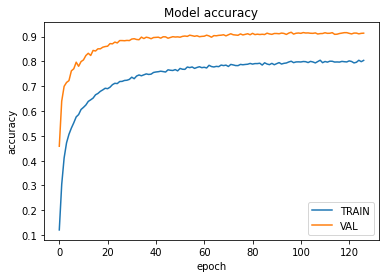

In [ ]:
# Visualize the training history to see whether you're overfitting.
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'VAL'], loc='lower right')
plt.show()

In [ ]:
print('-----------------EVAUATION----------------')
loss, accuracy = model.evaluate(processed_X_test, y_test)
print('LOSS: ', loss)
print("ACCURACY: ", accuracy)

-----------------EVAUATION----------------
615/615 [==============================] - 1s 2ms/step - loss: 0.3310 - accuracy: 0.9190
LOSS:  0.3309601843357086
ACCURACY:  0.9189628958702087


## Loading in Trained Model

In [ ]:
inputs = tf.keras.Input(shape=(34))
layer = keras.layers.Dense(128, activation=tf.nn.relu6)(inputs)
layer = keras.layers.Dropout(0.5)(layer)
layer = keras.layers.Dense(128, activation=tf.nn.relu6)(layer)
layer = keras.layers.Dropout(0.5)(layer)
layer = keras.layers.Dense(64, activation=tf.nn.relu6)(layer)
layer = keras.layers.Dropout(0.5)(layer)
outputs = keras.layers.Dense(len(class_names), activation="softmax")(layer)

In [ ]:
model = keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/yoga_dataset/weights_yoga_dataset.best2.hdf5"

model.load_weights(checkpoint_path)

In [ ]:
print('-----------------EVAUATION----------------')
loss, accuracy = model.evaluate(processed_X_test, y_test)
print('LOSS: ', loss)
print("ACCURACY: ", accuracy)

-----------------EVAUATION----------------
615/615 [==============================] - 4s 2ms/step - loss: 0.3151 - accuracy: 0.9214
LOSS:  0.31510552763938904
ACCURACY:  0.9213523268699646


## Confusion Matrix

In [ ]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Our function needs a different name to sklearn's plot_confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes, figsize=(50, 50), text_size=15, norm=False, savefig=False): 
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes.any():
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()
  plt.xticks(rotation=90)


  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

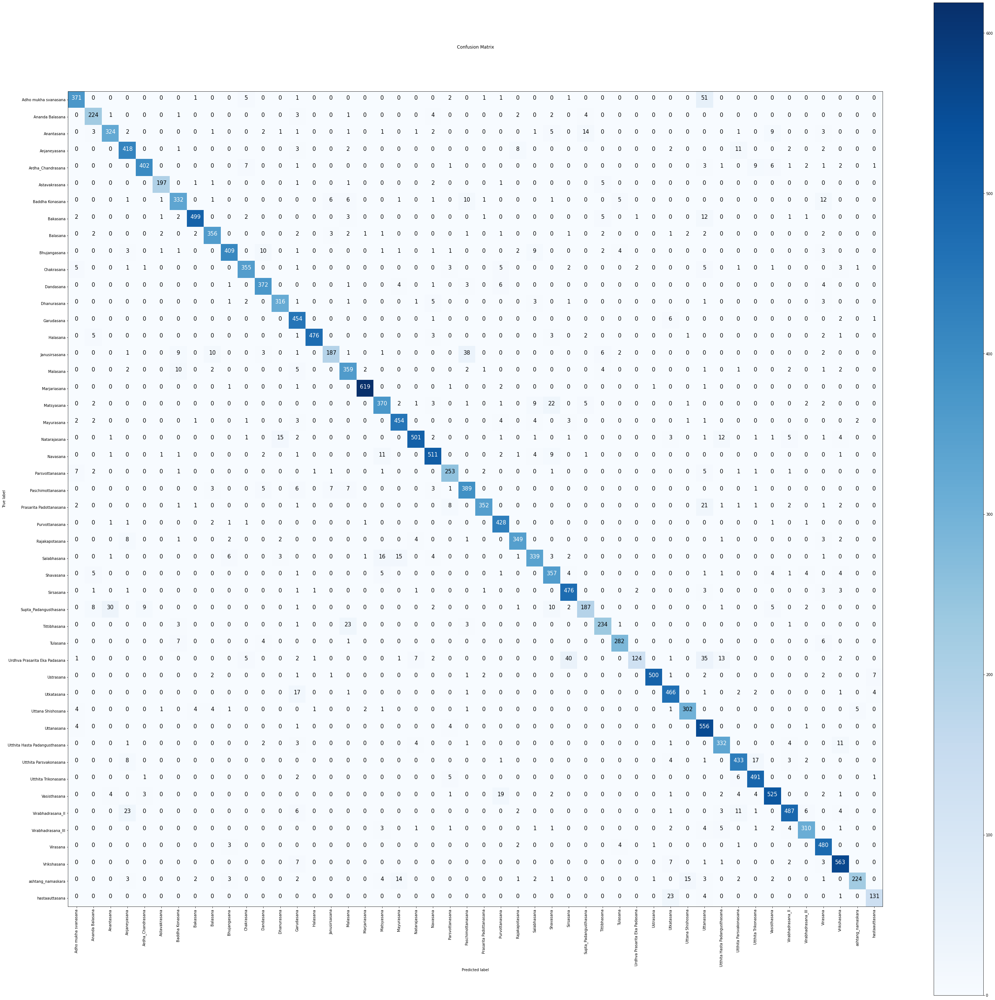

In [ ]:
pred_probs = model.predict(processed_X_test)
y_pred = pred_probs.argmax(axis = 1)
y_true = y_test.argmax(axis = 1)

# print(y_pred)
# print(y_true)
# print(class_names)

make_confusion_matrix(y_true,y_pred,class_names,figsize = (50,50),savefig = True)

## Get Inferences

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import pandas as pd
import tensorflow as tf

### Helper Functions for plotting

In [ ]:
EDGES = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

## Drawing the keypoints
def draw_keypoints(frame,keypoints,confidence_thresh):
    for kp in keypoints:
      kx,ky,kp_conf = kp
      if kp_conf > confidence_thresh:
        cv2.circle(frame,(int(kx),int(ky)), 4, (0,0,255), -2)

def draw_connections(frame,keypoints,edges, confidence_thresh):
    shaped = np.squeeze(keypoints)

    for edge,color in edges.items():
      p1,p2 = edge
      x1,y1,c1 = shaped[p1]
      x2,y2,c2 = shaped[p2]
      if(c1 > confidence_thresh) & (c2 > confidence_thresh):
        cv2.line(frame,(int(x1),int(y1)),(int(x2),int(y2)),(0,255,255),3)

def image_resize(image,width = None,height = None,inter = cv2.INTER_AREA):
    (h,w,_) = image.shape
    if width is None and height is None:
        return image
    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))
    resized = cv2.resize(image, dim, interpolation = inter)
    return resized

### Get inferences for a single image

In [ ]:
def get_inference_img(img_path, y_true = None):
    img = cv2.imread(img_path)
    img = image_resize(img,width = 600)

    rgb_tensor = tf.convert_to_tensor(img, dtype=tf.uint8)
    person = detect(rgb_tensor)

    pose_landmarks = np.array([[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score] for keypoint in person.keypoints], dtype=np.float32)
    test_coord = pose_landmarks.flatten().tolist()

    keypoints = []
    for kp in person.keypoints:
        keypoints.append([kp.coordinate.x,kp.coordinate.y,kp.score])

    embedding = landmarks_to_embedding(tf.reshape(tf.convert_to_tensor(test_coord),(1,51)))
    embed = tf.reshape(embedding, (34))
    test_pro = tf.reshape(tf.convert_to_tensor(embed),(1,34))

    pred_probs = model.predict(test_pro)
    pred_classes = pred_probs.argmax(axis = 1)
    label = class_names[pred_classes[0]]

    if(y_true is None):
        color = "blue"
    else:
        if(label == y_true):
            color = "green"
        else:
            color = "red"

    draw_connections(img,keypoints,EDGES,0.1)
    draw_keypoints(img,keypoints,0.1)

    plt.xlabel("Pred: {} {:2.0f}% (True: {})".format(label, 100*tf.reduce_max(pred_probs),y_true), color = color)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

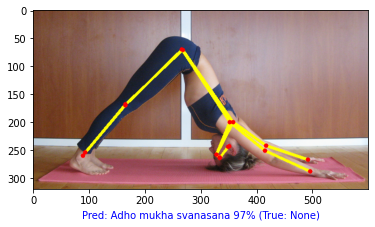

In [ ]:
get_inference_img("/content/drive/MyDrive/yoga_dataset/Dog.jpg")

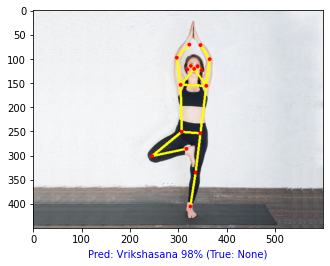

In [ ]:
get_inference_img("/content/drive/MyDrive/yoga_dataset/Tree-Pose.jpg",None)

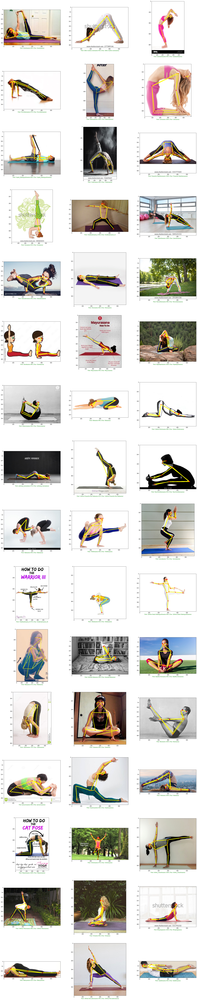

In [ ]:
IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 49

dir_path = "/content/drive/MyDrive/yoga_dataset/inference_images"

row_cnt = len(os.listdir(dir_path))
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_cnt))

lst = os.listdir(dir_path)

for i,f in enumerate(lst):
    # print(f)
    ax = fig.add_subplot(row_cnt,IMAGE_PER_ROW,i+1)
    img_p = dir_path + '/' + f
    actual = f.split('.')[0]
    img = get_inference_img(img_p,actual)

plt.show()

## Converting Model to tensorflow lite model

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

print('Model size: %dKB' % (len(tflite_model) / 1024))

with open('pose_classifier.tflite', 'wb') as f:
  f.write(tflite_model)

INFO:tensorflow:Assets written to: /tmp/tmpenglk8ru/assets


Model size: 35KB


In [ ]:
with open('pose_labels.txt', 'w') as f:
  f.write('\n'.join(class_names))

### check the accuracy of the tflite model

In [ ]:
from sklearn.metrics import accuracy_score, classification_report
import numpy as np
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

def evaluate_model(interpreter, X, y_true):
  """Evaluates the given TFLite model and return its accuracy."""
  input_index = interpreter.get_input_details()[0]["index"]
  output_index = interpreter.get_output_details()[0]["index"]

  # Run predictions on all given poses.
  y_pred = []
  for i in range(len(y_true)):
    # Pre-processing: add batch dimension and convert to float32 to match with
    # the model's input data format.
    test_image = X[i: i + 1].astype('float32')
    interpreter.set_tensor(input_index, test_image)

    # Run inference.
    interpreter.invoke()

    # Post-processing: remove batch dimension and find the class with highest
    # probability.
    output = interpreter.tensor(output_index)
    predicted_label = np.argmax(output()[0])
    y_pred.append(predicted_label)

  # Compare prediction results with ground truth labels to calculate accuracy.
  y_pred = keras.utils.to_categorical(y_pred)
  return accuracy_score(y_true, y_pred)

# Evaluate the accuracy of the converted TFLite model
classifier_interpreter = tf.lite.Interpreter(model_content=tflite_model)
classifier_interpreter.allocate_tensors()
print('Accuracy of TFLite model: %s' %
      evaluate_model(classifier_interpreter, processed_X_test, y_test))

Accuracy of TFLite model: 0.9193187595322827
